In [ ]:
# Copyright (c) 2025, ETH Zurich

In [ ]:
import os
import pathlib
import datetime

In [56]:
# This cell is tagged `parameters`
system = "<FOLDER NAME OF SYSTEM>"
sample_size_cm = 6
storage = "<PATH TO SYSTEM FOLDER>"
binning = 2

# Initialisation

In [57]:
%matplotlib inline

In [58]:
import glob
import os

import numpy as np
import scipy
import scipy.constants as cnst
import matplotlib as mpl
import matplotlib.pyplot as plt
import skimage as ski
import xarray as xr
import tomopy
import astra

import sys
import spekpy as sp

import skimage
from scipy import interpolate
import skimage.io as io
import xraydb
import utils.icru44data as icru44data

import xraydb
import json
from filelock import FileLock

In [59]:
# matplotlib style
plt.style.use("default")

# set FIGWIDTH to latex's \textwidth
FIGWIDTH = 3
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 5
plt.rcParams["figure.figsize"] = (FIGWIDTH, FIGWIDTH * 2 / 3)
plt.rcParams["figure.dpi"] = 300
plt.rcParams["figure.constrained_layout.use"] = "True"

# images
plt.rcParams["image.interpolation"] = "bicubic"
plt.rcParams["image.cmap"] = "Greys_r"

# axes
# plt.rcParams["axes.spines.right"] = False
# plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.edgecolor"] = "0.7"
plt.rcParams["axes.linewidth"] = "1"

# legend
plt.rcParams["legend.frameon"] = False

plt.rcParams["lines.markersize"] = 1
# plt.rcParams["lines.markerfacecolor"] = "white"
# Okabe-Ito palette
plt.rcParams["axes.prop_cycle"] = plt.cycler(
    color=[
        "#000000",
        "#E69F00",
        "#56B4E9",
        "#009E73",
        "#F0E442",
        "#0072B2",
        "#D55E00",
        "#CC79A7",
    ],
    #marker=None #["o", "^", "s", "p", "D", "v", "v", "d"],
)

plt.rcParams['axes.grid'] = False

# Funtionalities for CNR calculation and NPS

In [60]:
def get_mask_span(m):
    x0 = m.any(axis=0).nonzero()[0][0]
    x1 = m.any(axis=0).nonzero()[0][-1]
    y0 = m.any(axis=1).nonzero()[0][0]
    y1 = m.any(axis=1).nonzero()[0][-1]

    #print(x0, x1, y0, y1)
    return y0, y1, x0, x1

def get_mask_sel(m, margin=0):
    y0, y1, x0, x1 = get_mask_span(m)

    return np.s_[..., (y0 - margin) : (y1 + margin + 1), (x0 - margin) : (x1 + margin + 1)]

idx_row = 4

### Functions for image fusion
def normalise(d, m1, m2, ref):
    s1 = get_mask_sel(m1, margin=0)
    s2 = get_mask_sel(m2, margin=0)

    v1 = ref[:][s1].mean()
    v2 = ref[:][s2].mean()

    return (d - v1) / (v2 - v1)

def fuse(d1, d2, sigma):
    d1f = scipy.ndimage.gaussian_filter(d1, sigma=[0, sigma, sigma])
    d2f = d2 - scipy.ndimage.gaussian_filter(d2, sigma=[0, sigma, sigma])
    
    return d1f + d2f

def fuse_normalized(d1, d2, sigma, m1, attenuation):
    d1f = scipy.ndimage.gaussian_filter(d1, sigma=[0, sigma, sigma])
    d2f = d2 - scipy.ndimage.gaussian_filter(d2, sigma=[0, sigma, sigma])
    
    s1 = get_mask_sel(m1, margin = 0)
    v1 = attenuation[:][s1].mean()
    
    fused = d1f + d2f
    
    v2 = fused[:][s1].mean()
    fused = fused * v1 / v2
    
    return fused

def fuse_abs(d1, d2, sigma, m1):
    d1f = scipy.ndimage.gaussian_filter(d1, sigma = [0, sigma, sigma])
    d2f = d2 - scipy.ndimage.gaussian_filter(d2, sigma = [0, sigma, sigma])
    s1 = get_mask_sel(m1, margin = 0)
    v1 = d1f[:][s1].mean()
    v2 = d2[:][s1].mean()
    
    return d1f + 2* d2f * v1 / v2
    

def fuse(d1, d2, sigma):
    d1f = scipy.ndimage.gaussian_filter(d1, sigma=[0, sigma, sigma])
    d2f = d2 - scipy.ndimage.gaussian_filter(d2, sigma=[0, sigma, sigma])

    return d1f + d2f

def get_area_roi(sample_size_cm, system = 'GI-BCT_V2'):
    global voxel_size
    global vmin_abs
    global vmax_abs
    global vmin_ref
    global vmax_ref
    
    phantom = io.imread(os.path.join(storage, f"{system}_tumor/{system}_{sample_size_cm}_phantom.tif"))
    #print(os.path.join(storage, f"{system}_tumor/{system}_{sample_size_cm}_phantom.tif"))
    #print(phantom.shape)
    if 'GI-BCT_V2' in system:
        voxel_size = 62.141479456616764 * 1e-4 * binning
        vmin_abs = -1
        vmax_abs = 2
        vmin_ref = -1
        vmax_ref = 2
        
    elif 'Static' in system:
        voxel_size = 58.6405529953917 * 1e-4 * binning
        vmin_abs = -1
        vmax_abs = 2
        vmin_ref = -1
        vmax_ref = 2
        
    elif 'nuview' in system:
        voxel_size = 76.92307692307692 * 1e-4 * binning
    
    radius_disk = 0.046 * sample_size_cm
    radius_disk = np.floor(radius_disk / voxel_size)

    fibroglandular_center = (phantom.shape[0] * 0.6, phantom.shape[1] * 0.7)

    rr, cc = skimage.draw.disk((fibroglandular_center[1], fibroglandular_center[0]), radius = radius_disk, shape=phantom.shape)
    fibro_circle = np.zeros_like(phantom, dtype = np.int8)
    fibro_circle[rr, cc] = 1

    adipose_center = (phantom.shape[0] * 0.42, phantom.shape[1] * 0.2)

    rr, cc = skimage.draw.disk((adipose_center[1], adipose_center[0]), radius = radius_disk, shape=phantom.shape)
    adi_circle = np.zeros_like(phantom, dtype = np.int8)
    adi_circle[rr, cc] = 1

    tumor_center = (phantom.shape[0] * 0.54, phantom.shape[1] * 0.46)

    rr, cc = skimage.draw.disk((tumor_center[1], tumor_center[0]), radius = radius_disk, shape=phantom.shape)
    tumor_circle = np.zeros_like(phantom, dtype = np.int8)
    tumor_circle[rr, cc] = 1
    
    return fibro_circle, adi_circle, tumor_circle, phantom

def write_to_json(file_path, sample_size, result):
    # Lock file to prevent concurrent writes
    lock = FileLock(f"{file_path}.lock")
    with lock:
        # Load existing data or initialize as an empty dictionary
        try:
            with open(file_path, "r") as file:
                data = json.load(file)
        except (FileNotFoundError, json.JSONDecodeError):
            data = {}

        # Update the data with the new result
        data[sample_size] = result

        # Write the updated data back to the file
        with open(file_path, "w") as file:
            json.dump(data, file, indent=4)

In [61]:
def window_image(image, window=None, *args, **kwargs):
    if window is None:
        window = lambda x: x
        return image
    window = window(image.shape[-2], *args)[:, np.newaxis] * window(
        image.shape[-1], *args, **kwargs
    )
    windowed_image = image * window
    return windowed_image

def windowed_nps(image, vxsize, window=scipy.signal.windows.hann, *args, **kwargs):
    # ref. https://aapm.onlinelibrary.wiley.com/doi/pdf/10.1120/jacmp.v17i3.5841

    # remove the mean
    im = image - np.nanmean(image)

    # window the image
    im = window_image(im, window, *args, **kwargs)

    # Fourier Transform
    f = (
        np.abs(np.fft.fft2(im)) ** 2
        * (vxsize / image.shape[0])
        * (vxsize / image.shape[1])
    )

    # put zero frequency in the centre
    nps = np.fft.fftshift(f)

    return nps

def azimuthal_average(image, nbins=None, center=None):
    y, x = np.indices(image.shape)

    if center is None:
        center = np.array(image.shape) // 2

    if nbins is None:
        nbins = np.min(image.shape) // 2

    xc = x - center[1]
    yc = y - center[0]

    r = np.sqrt(xc**2 + yc**2)
    rbins = np.linspace(0, np.min(image.shape) / 2, nbins + 1)
    rbinned, bin_edges, _ = scipy.stats.binned_statistic(
        r.ravel(), image.ravel(), bins=rbins
    )
    # bin_centres = np.convolve(bin_edges, [0.5, 0.5], mode="valid")

    return bin_edges[:-1], rbinned

def calculate_nps(image, vxsize):
    nps = windowed_nps(image, vxsize)
    
    dfreq_invpx = 1 / image.shape[-1]
    npsfreqs_sampled, nps = azimuthal_average(nps)
    
    npsfreqs_invpx = npsfreqs_sampled * dfreq_invpx
    npsfreqs_invmm = npsfreqs_invpx / vxsize / 1e3
    
    nps = nps/np.nanmean(image)**2*1e6
    return npsfreqs_invmm, nps

# Check individual images

In [62]:
d = 20

phantom = io.imread(os.path.join(storage, f"{system}_tumor/{system}_{sample_size_cm}_phantom.tif"))
attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{d}mGy.tif"))
refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{d}mGy.tif"))

fibro_circle, adi_circle, tumor_circle, phantom = get_area_roi(sample_size_cm, system)

s1 = get_mask_sel(fibro_circle, margin=0)

region_ref = refraction[4][s1]
region_abs = attenuation[4][s1]

att_filtered = scipy.ndimage.gaussian_filter(attenuation, sigma = [1.0, 2.0, 2.0])
ref_filtered = scipy.ndimage.gaussian_filter(refraction, sigma = [1.0, 2.0, 2.0])

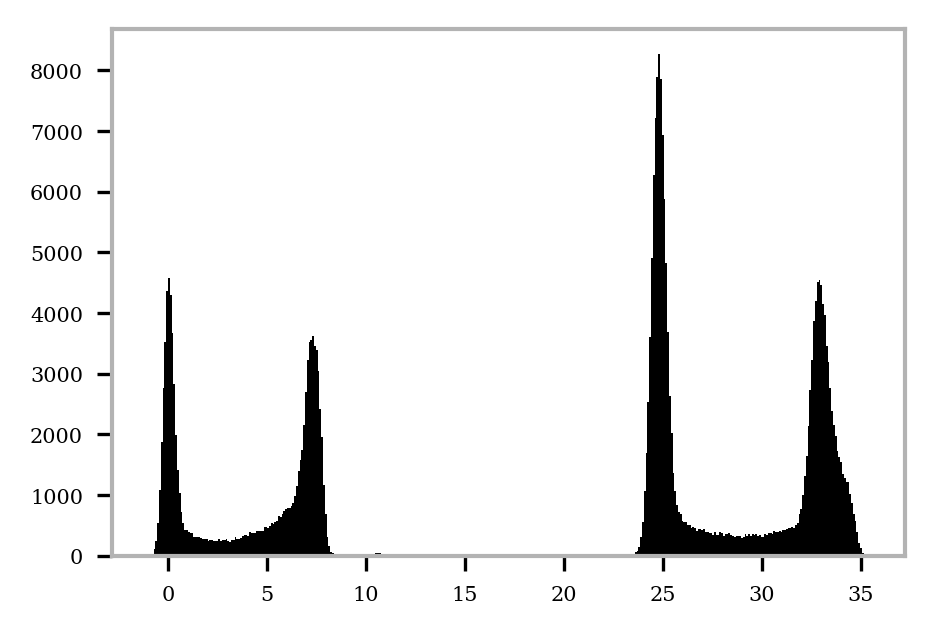

In [63]:
hist = plt.hist(att_filtered[4,...].ravel(), bins = 400)

In [64]:
system

'GI-BCT_V2_200'

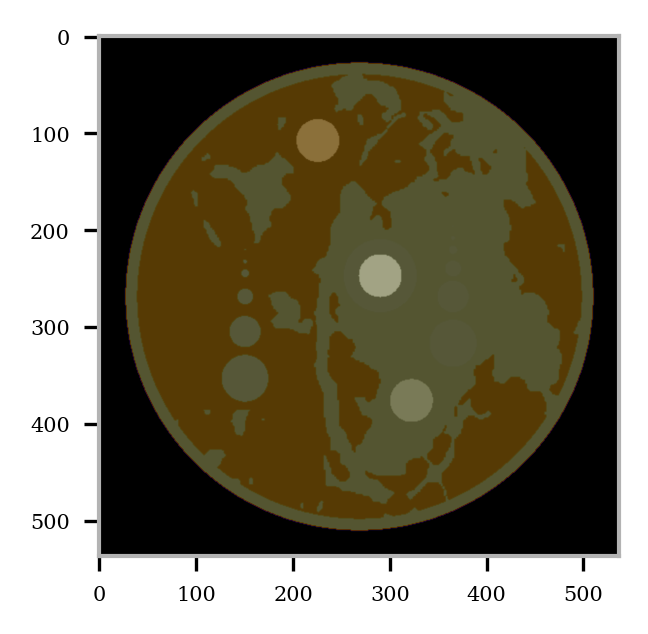

In [65]:
fibro_circle, adi_circle, tumor_circle, phantom = get_area_roi(sample_size_cm, system)
plt.imshow(phantom, cmap = 'inferno')
plt.imshow(fibro_circle, alpha = 0.3)
plt.imshow(adi_circle, alpha = 0.3)
plt.imshow(tumor_circle, alpha = 0.3)

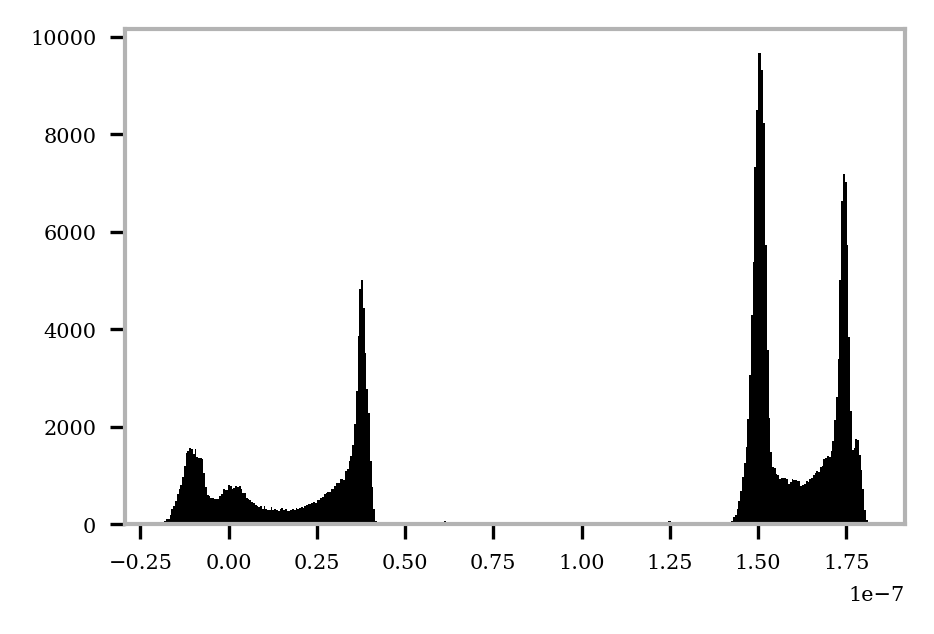

In [66]:
hist = plt.hist(ref_filtered[4,...].ravel(), bins = 400)

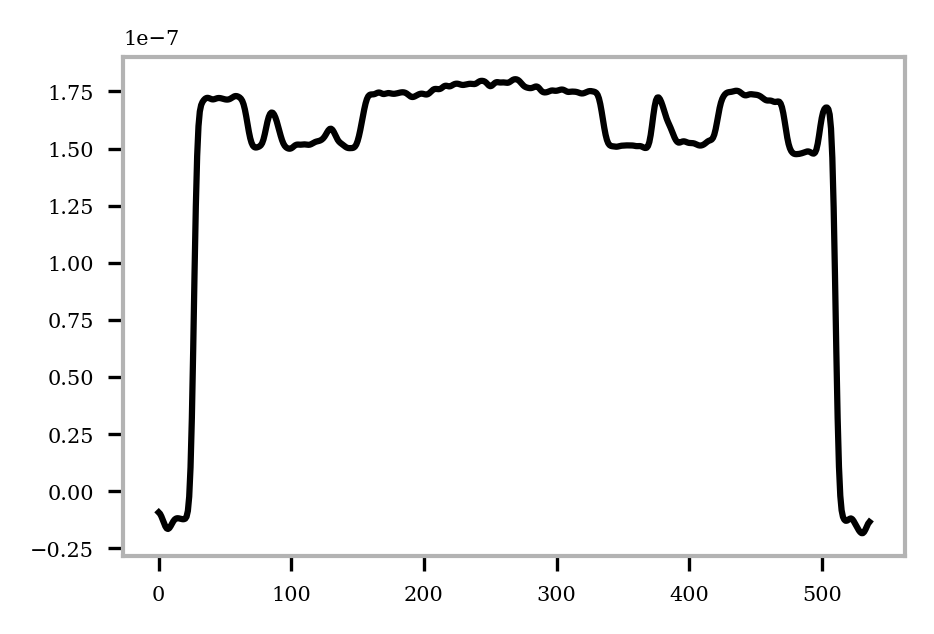

In [67]:
plt.plot(ref_filtered[4,:,ref_filtered.shape[2]//2])

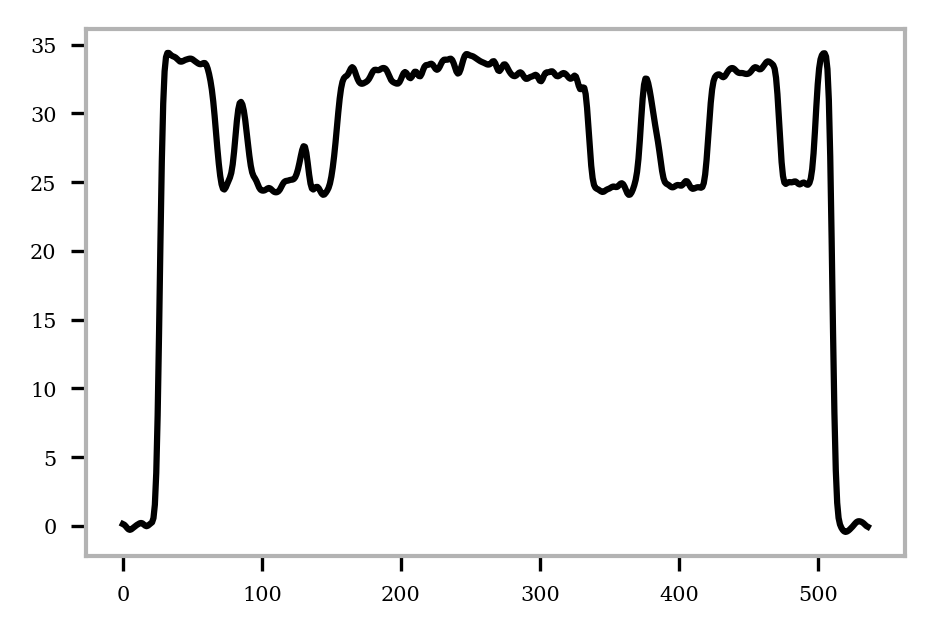

In [68]:
plt.plot(att_filtered[4,:,ref_filtered.shape[2]//2])

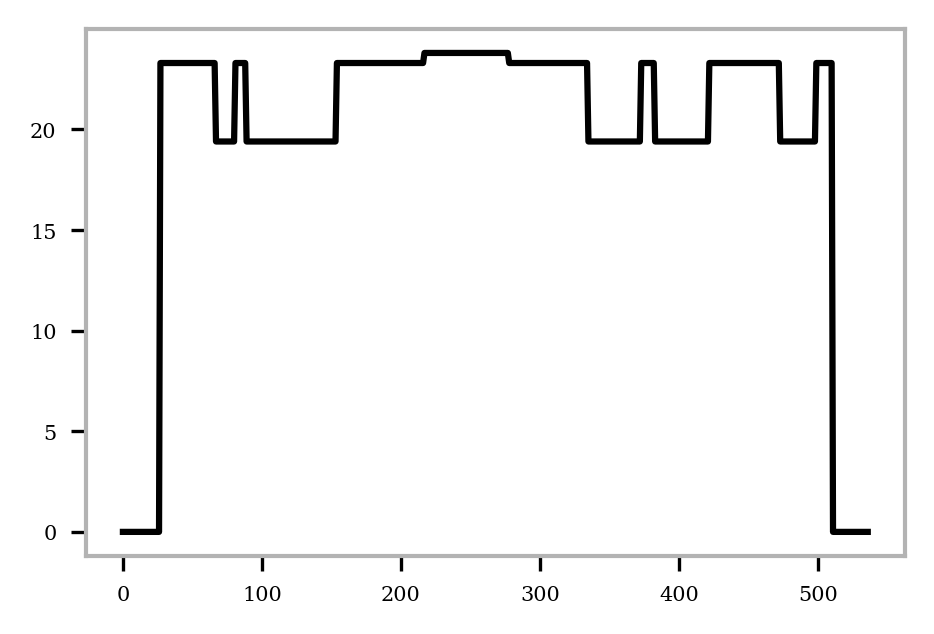

In [69]:
plt.plot(phantom[:,ref_filtered.shape[2]//2])

# Calculate NPS

In [20]:
breast_sizes = [6, 9, 12, 14, 16, 18]
doses = [10, 20, 30, 40, 50, 60, 70, 80, 90]
vxsize = voxel_size * 1e-2

Text(0.5, 0.01, 'Spatial frequency $k$ [1/mm]')

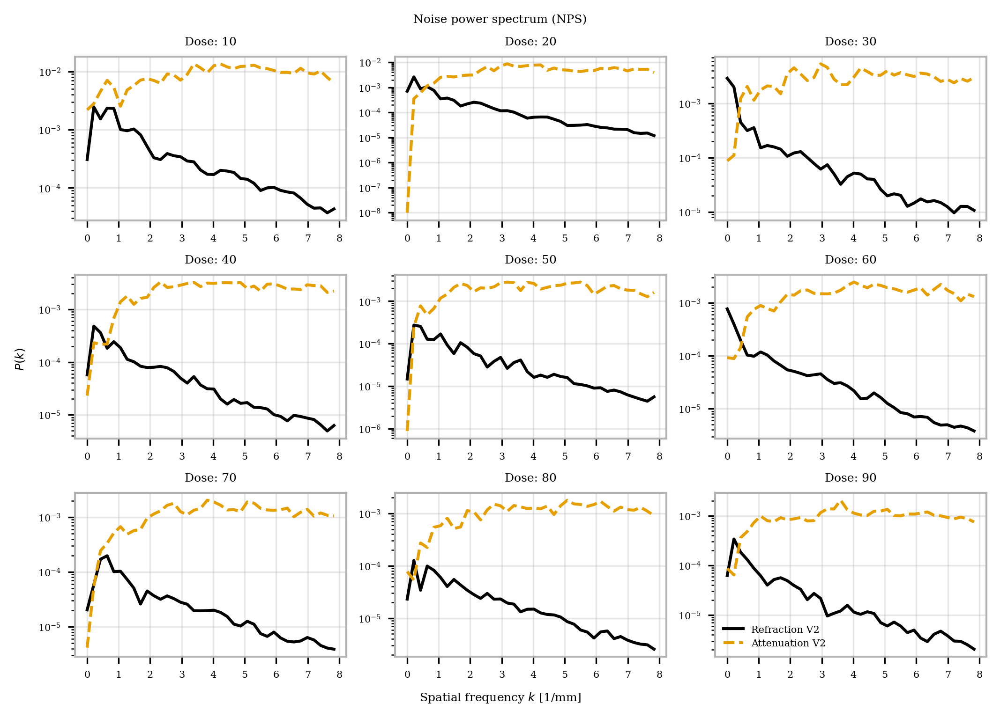

In [21]:
mask_glandular, mask_adipose, tumor_circle, phantom = get_area_roi(sample_size_cm, system = system)
s1 = get_mask_sel(mask_glandular, margin=0)


fig, axs = plt.subplots(figsize= (7,5), nrows = 3, ncols = 3)
axs = axs.ravel()

ref_v2_all = []
att_v2_all = []

att_ref = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_100mGy.tif"))
ref_ref = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_100mGy.tif"))



for i, d in enumerate(doses):
    attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{d}mGy.tif"))
    refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{d}mGy.tif"))
    
    ref_ref = refraction.astype(np.float32)
    att_ref = attenuation.astype(np.float32)
    
    dphn = normalise(
        refraction.astype(np.float32),
        mask_adipose,
        mask_glandular,
        ref_ref)
        
    dattn = normalise(
        attenuation.astype(np.float32),
        mask_adipose,
        mask_glandular,
        att_ref)
    
    region_ref = dphn[4][s1]
    region_abs = dattn[4][s1]
    
    frequencies, ref_v2_nps = calculate_nps(region_ref, vxsize)
    frequencies, att_v2_nps = calculate_nps(region_abs, vxsize)
    
    ref_v2_all.append(ref_v2_nps)
    att_v2_all.append(att_v2_nps)
    
    axs[i].plot(frequencies, ref_v2_nps, color="C0", linestyle="-", alpha=1)
    axs[i].plot(frequencies, att_v2_nps, color="C1", linestyle="--", alpha=1)
    axs[i].grid("on", alpha=0.3)
    axs[i].set_yscale('log')
    axs[i].set_title(f"Dose: {d}")
fig.supylabel("$P(k)$")
fig.suptitle("Noise power spectrum (NPS)")
axs[-1].legend(["Refraction V2", "Attenuation V2"])
axs[i].grid("on", alpha=0.3)
fig.supxlabel("Spatial frequency $k$ [1/mm]")
#plt.tight_layout()
    

Text(0.5, 1.0, 'Absorption Noise')

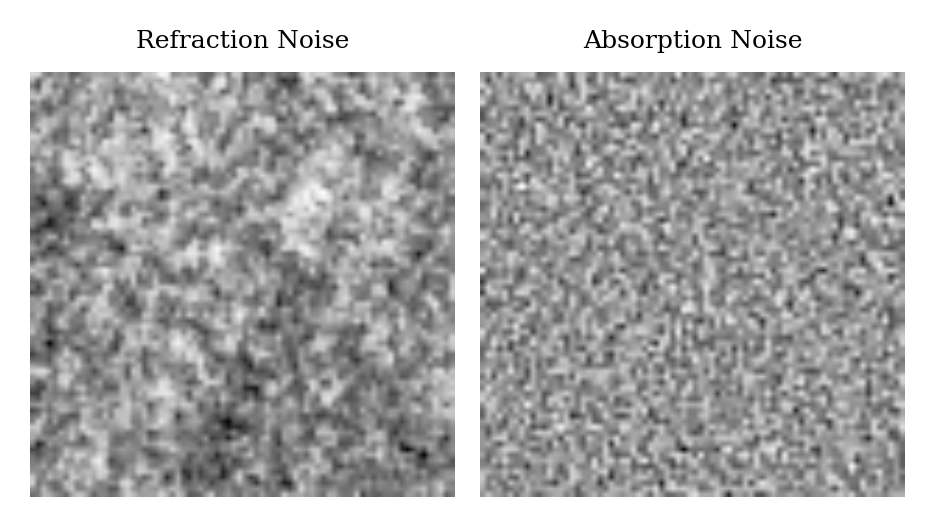

In [22]:
fig, axs = plt.subplots(nrows = 1, ncols = 2)
axs[0].imshow(region_ref, interpolation = 'bilinear')
axs[0].axis('off')
axs[0].set_title('Refraction Noise')

axs[1].imshow(region_abs, interpolation = 'bilinear')
axs[1].axis('off')
axs[1].set_title('Absorption Noise')

In [23]:
color=[
    "#000000",
    "#E69F00",
    "#56B4E9",
    "#009E73",
    "#F0E442",
    "#0072B2",
    "#D55E00",
    "#CC79A7",
    "tab:purple",
    "tab:red",
]

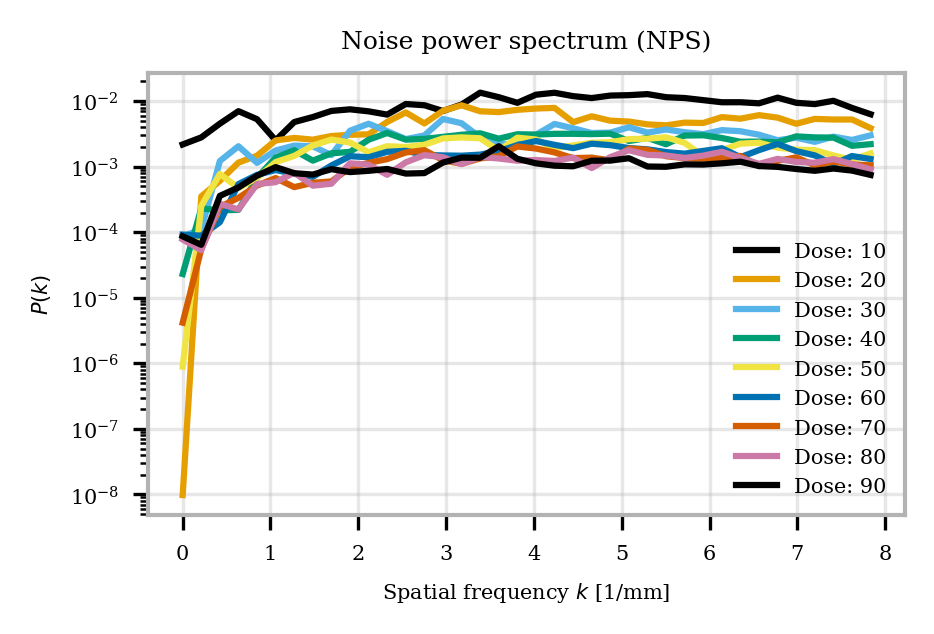

In [24]:
# NPS
for i, d in enumerate(doses[:]):
    
    plt.plot(frequencies, att_v2_all[i], alpha=1, label = f"Dose: {d}")

plt.ylabel("$P(k)$")
plt.title("Noise power spectrum (NPS)")
plt.legend()
#plt.legend(["Refraction V2", "Attenuation V2"])
plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.yscale('log')
#plt.ylim([1e5,1e9])
#plt.xlim([0,20])

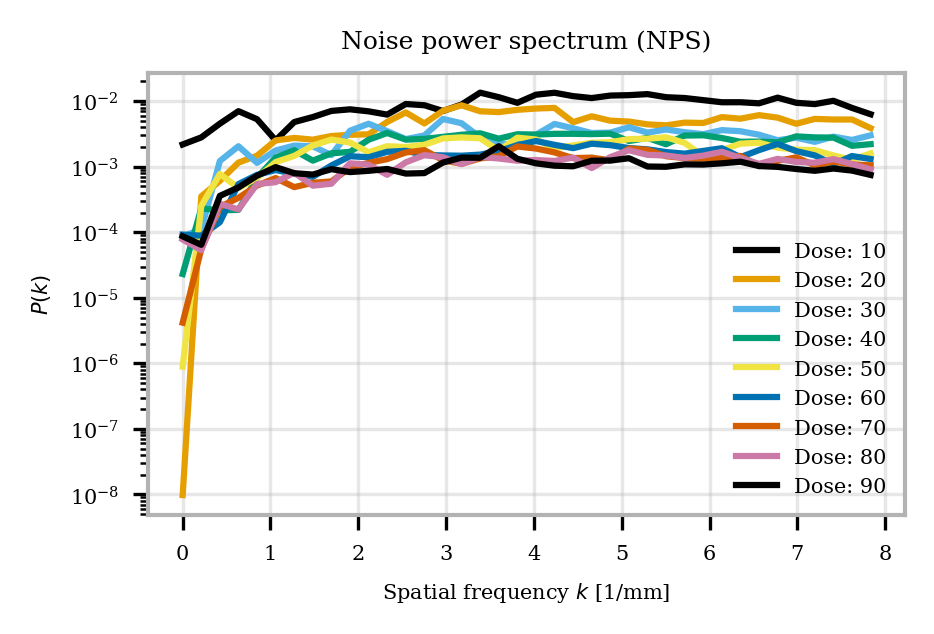

In [25]:
# NPS
for i, d in enumerate(doses[:]):
    
    plt.plot(frequencies, att_v2_all[i], alpha=1, label = f"Dose: {d}")

plt.ylabel("$P(k)$")
plt.title("Noise power spectrum (NPS)")
plt.legend()
#plt.legend(["Refraction V2", "Attenuation V2"])
plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.yscale('log')
#plt.ylim([1e5,1e9])
#plt.xlim([0,20])

20
40
60
80


/tmp/ipykernel_498706/4092126522.py:17: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


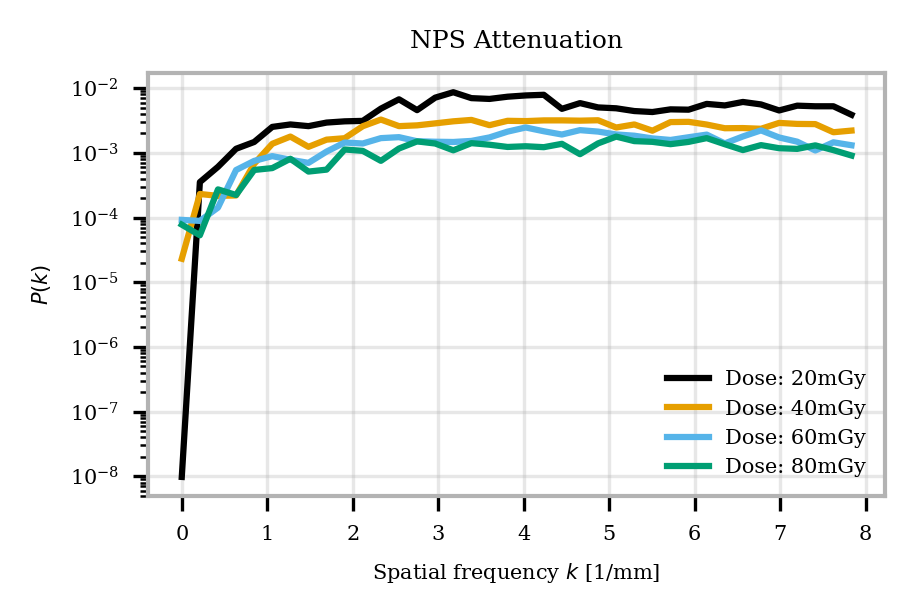

In [26]:
j = 0
for i, d in enumerate(doses[1::]):
    if i % 2 == 0:
        print(d)
        plt.plot(frequencies, att_v2_all[i+1], alpha=1, label = f"Dose: {d}mGy", color = color[j])
        j +=1


plt.ylabel("$P(k)$")
plt.title("NPS Attenuation")

plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.yscale('log')
plt.legend()
#plt.xlim([0,20])
plt.tight_layout()


/tmp/ipykernel_498706/3267101286.py:16: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


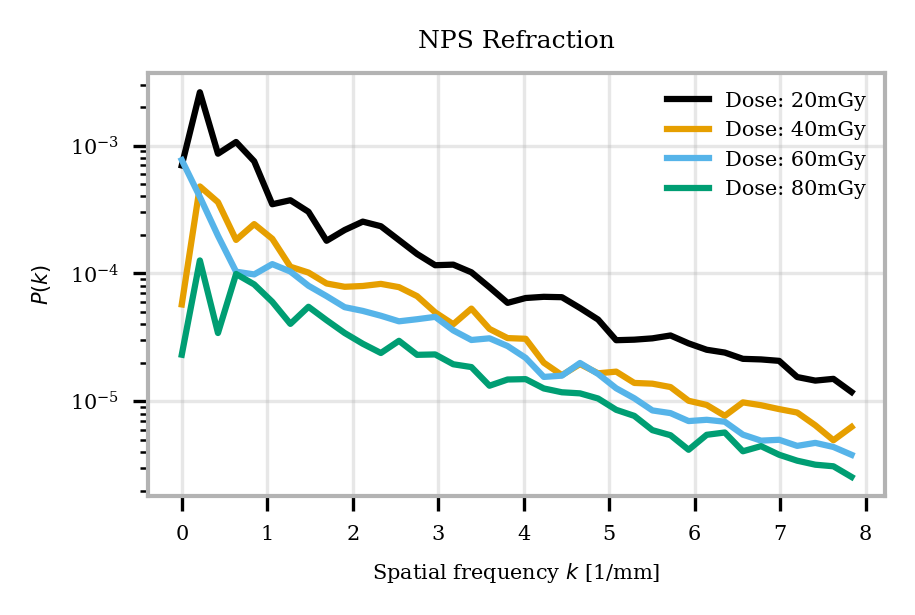

In [27]:
j = 0
for i, d in enumerate(doses[1::]):
    if i % 2 == 0:
        plt.plot(frequencies, ref_v2_all[i+1], alpha=1, label = f"Dose: {d}mGy", color = color[j])
        j +=1


plt.ylabel("$P(k)$")
plt.title("NPS Refraction")

plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.yscale('log')
plt.legend()
#plt.xlim([0,20])
plt.tight_layout()


/tmp/ipykernel_498706/2291102896.py:16: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


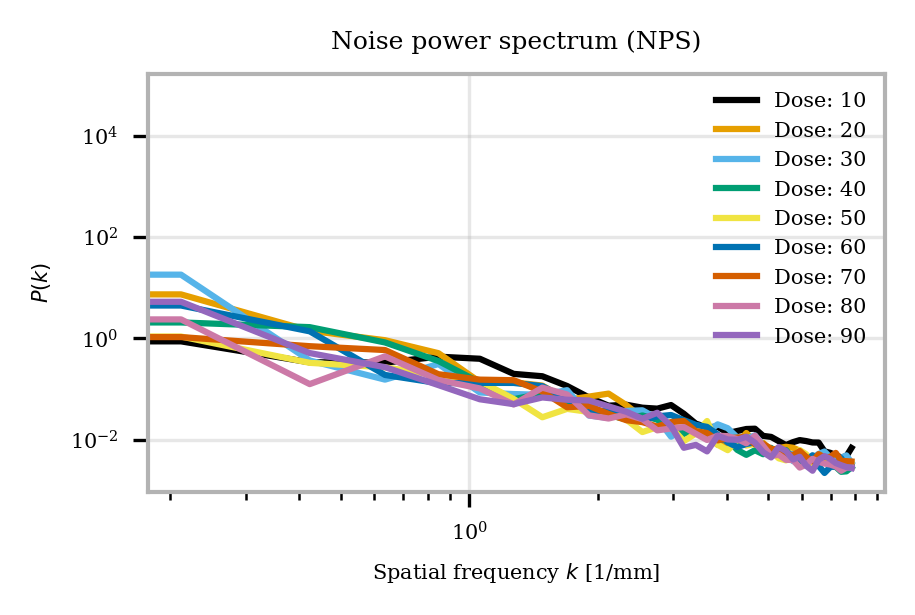

In [28]:
j = 0
for i, d in enumerate(doses):
    plt.plot(frequencies, ref_v2_all[i]/att_v2_all[i], alpha=1, label = f"Dose: {d}", color = color[j])
    j +=1


plt.ylabel("$P(k)$")
plt.title("Noise power spectrum (NPS)")

plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.yscale('log')
plt.xscale('log')
plt.legend()
#plt.xlim([0,20])
plt.tight_layout()

In [29]:
ratio = []
idx_cutoff = []
length_frequency = ref_v2_all[i].shape
for i in range(len(doses)):
    try:
        ratio.append(ref_v2_all[i]/att_v2_all[i])
        if np.sum(ratio[-1] < 1) == length_frequency:
            #idx_cutoff.append(0)
            print('good for:', i)
            continue
            
        max_idx = np.argmax(ratio[-1])
        idx_cutoff.append(np.where(ratio[-1][max_idx:] < 1)[0][0] + max_idx)
    except:
        continue
median_idx = int(np.median(idx_cutoff))
cutoff = frequencies[int(median_idx)]

good for: 0


In [32]:
cutoff

0.423481862739625

/tmp/ipykernel_498706/2786897878.py:16: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


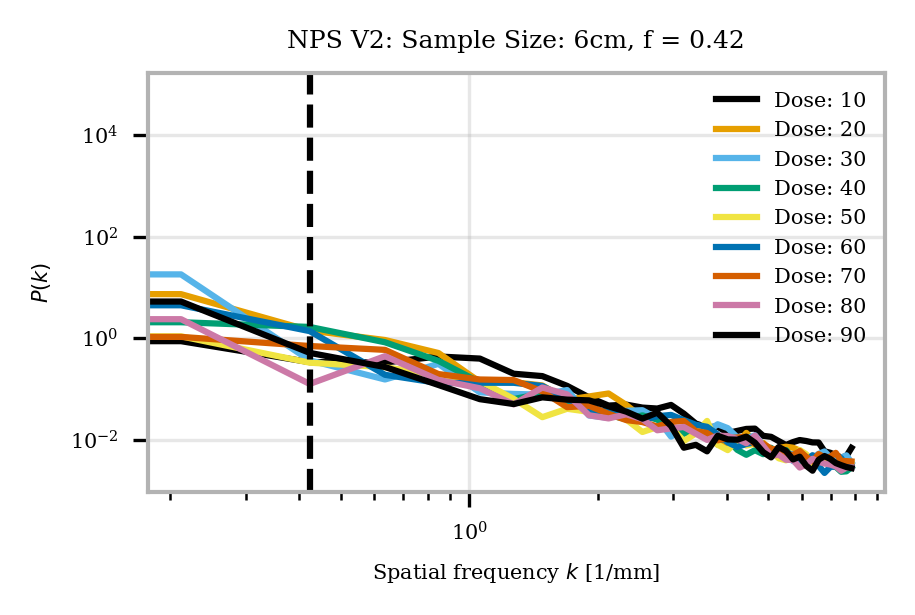

In [33]:
j = 0
for i, d in enumerate(doses[:]):
    plt.plot(frequencies, ref_v2_all[i]/att_v2_all[i], alpha=1, label = f"Dose: {d}")


plt.ylabel("$P(k)$")
plt.title(f"NPS V2: Sample Size: {sample_size_cm}cm, f = {frequencies[median_idx]:.2f}")

plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.axvline(cutoff, linestyle = '--')
plt.yscale('log')
plt.xscale('log')
plt.legend()
#plt.xlim([0,20])
plt.tight_layout()
#plt.savefig('../data/NPS_100_Static_cutoff.png', bbox_inches = 'tight')

/tmp/ipykernel_498706/171867926.py:18: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


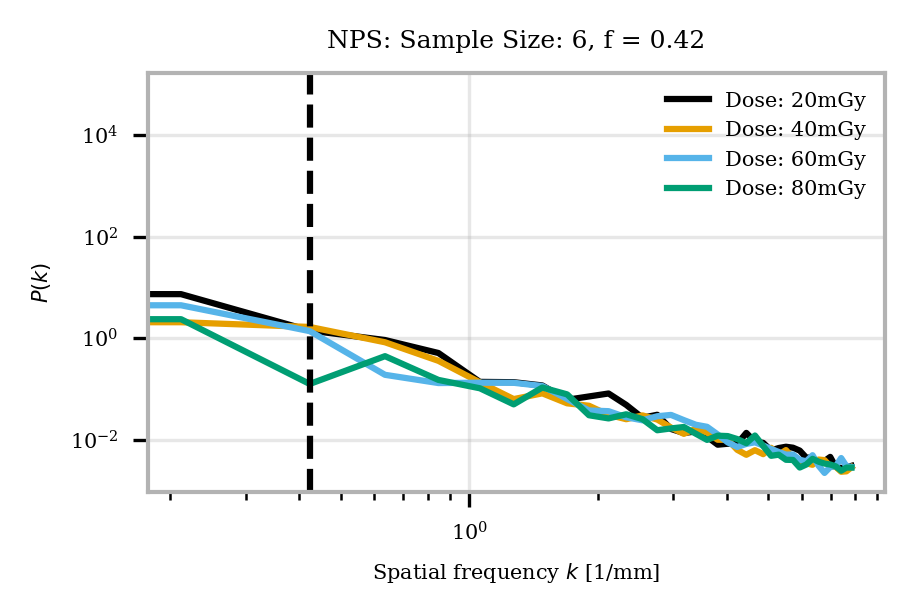

In [34]:
j = 0
for i, d in enumerate(doses[1::]):
    if i % 2 == 0:
        plt.plot(frequencies, ref_v2_all[i+1]/att_v2_all[i+1], alpha=1, label = f"Dose: {d}mGy", color = color[j])
        j +=1


plt.ylabel("$P(k)$")
plt.title(f"NPS: Sample Size: {sample_size_cm}, f = {frequencies[median_idx]:.2f}")

plt.grid("on", alpha=0.3)
plt.xlabel("Spatial frequency $k$ [1/mm]")
plt.axvline(cutoff, linestyle = '--')
plt.yscale('log')
plt.xscale('log')
plt.legend()
#plt.xlim([0,20])
plt.tight_layout()


In [35]:
FWHM_sigma_ft = cutoff
sigma_FT = FWHM_sigma_ft
sigma_FT_real_space = 1 / (2 * np.pi * sigma_FT)

print(sigma_FT_real_space)
sigma_FT_real_space_pixel = sigma_FT_real_space / (vxsize*1e3)
print(sigma_FT_real_space_pixel)

0.375824697809433
6.0478878374920235


Text(0.5, 0.01, 'Spatial frequency $k$ [1/mm]')

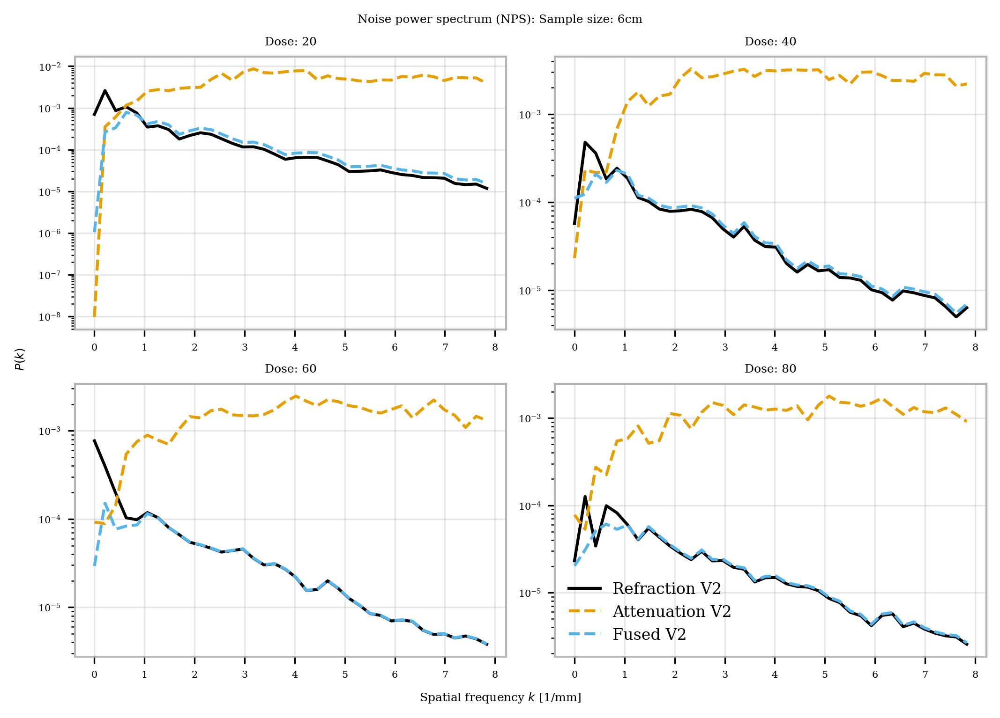

In [36]:
mask_glandular, mask_adipose, tumor_circle, phantom = get_area_roi(sample_size_cm, system = system)
s1 = get_mask_sel(mask_glandular, margin=0)


fig, axs = plt.subplots(figsize= (7,5), nrows = 2, ncols = 2)
axs = axs.ravel()

ref_v2_all = []
att_v2_all = []


att_ref = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_100mGy.tif"))
ref_ref = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_100mGy.tif"))


for i, d in enumerate(doses[1::2]):
    attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{d}mGy.tif"))
    refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{d}mGy.tif"))
    
    ref_ref = refraction.astype(np.float32)
    att_ref = attenuation.astype(np.float32)
    
    dphn = normalise(
        refraction.astype(np.float32),
        mask_adipose,
        mask_glandular,
        ref_ref)
        
    dattn = normalise(
        attenuation.astype(np.float32),
        mask_adipose,
        mask_glandular,
        att_ref)
    

    fused = fuse(dattn, dphn, sigma_FT_real_space_pixel)
    
    region_ref = dphn[4][s1]
    region_abs = dattn[4][s1]
    region_fused = fused[4][s1]

    frequencies, ref_v2_nps = calculate_nps(region_ref, vxsize)
    frequencies, att_v2_nps = calculate_nps(region_abs, vxsize)
    frequencies, fus_v2_nps = calculate_nps(region_fused, vxsize)
    
    
    ref_v2_all.append(ref_v2_nps)
    att_v2_all.append(att_v2_nps)
    
    axs[i].plot(frequencies, ref_v2_nps, color="C0", linestyle="-", alpha=1)
    axs[i].plot(frequencies, att_v2_nps, color="C1", linestyle="--", alpha=1)
    axs[i].plot(frequencies, fus_v2_nps, color="C2", linestyle="--", alpha=1)
    
    axs[i].grid("on", alpha=0.3)
    axs[i].set_yscale('log')
    axs[i].set_title(f"Dose: {d}")
fig.supylabel("$P(k)$")
fig.suptitle(f"Noise power spectrum (NPS): Sample size: {sample_size_cm}cm")
axs[-1].legend(["Refraction V2", "Attenuation V2", "Fused V2"], fontsize = 8)
axs[i].grid("on", alpha=0.3)
fig.supxlabel("Spatial frequency $k$ [1/mm]")
#plt.savefig('data/NPS_100_V2.png', bbox_inches = 'tight')
    

In [41]:
dose = 40
attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{dose}mGy.tif"))
refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{dose}mGy.tif"))
    
dphn = normalise(
    refraction.astype(np.float32),
    mask_adipose,
    mask_glandular,
    ref_ref)

dattn = normalise(
    attenuation.astype(np.float32),
    mask_adipose,
    mask_glandular,
    att_ref)

fused = fuse(dattn, dphn, sigma_FT_real_space_pixel)

att_filtered = scipy.ndimage.gaussian_filter(dattn, sigma = [1.0, 2.0, 2.0])
ref_filtered = scipy.ndimage.gaussian_filter(dphn, sigma = [1.0, 2.0, 2.0])
fus_filtered = scipy.ndimage.gaussian_filter(fused, sigma = [1.0, 2.0, 2.0])

fused_gland = fus_filtered

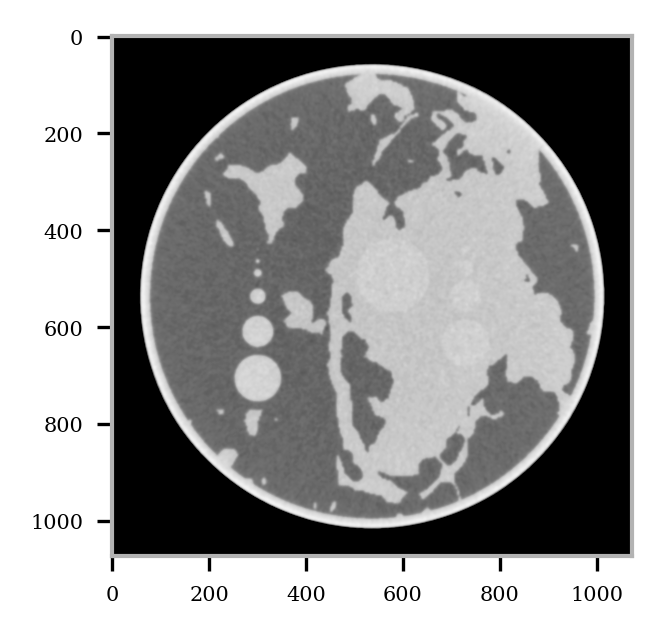

In [42]:
plt.imshow(fus_filtered[4,:,:], vmin = vmin_abs, vmax = vmax_abs)

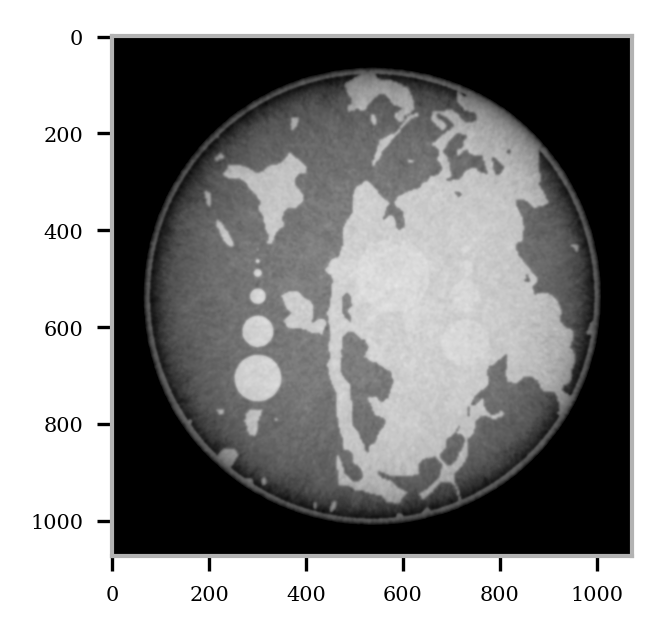

In [43]:
plt.imshow(ref_filtered[4,:,:], vmin = vmin_ref, vmax = vmax_ref)

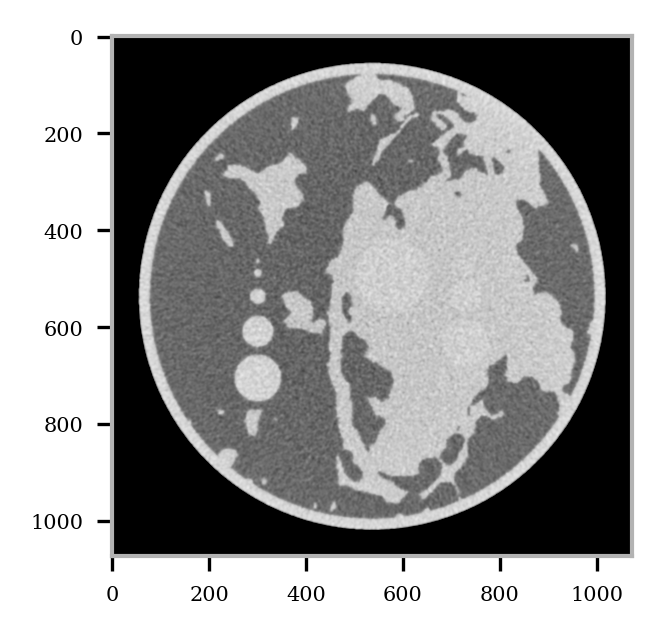

In [44]:
plt.imshow(att_filtered[4,:,:],  vmin = vmin_abs, vmax = vmax_abs)

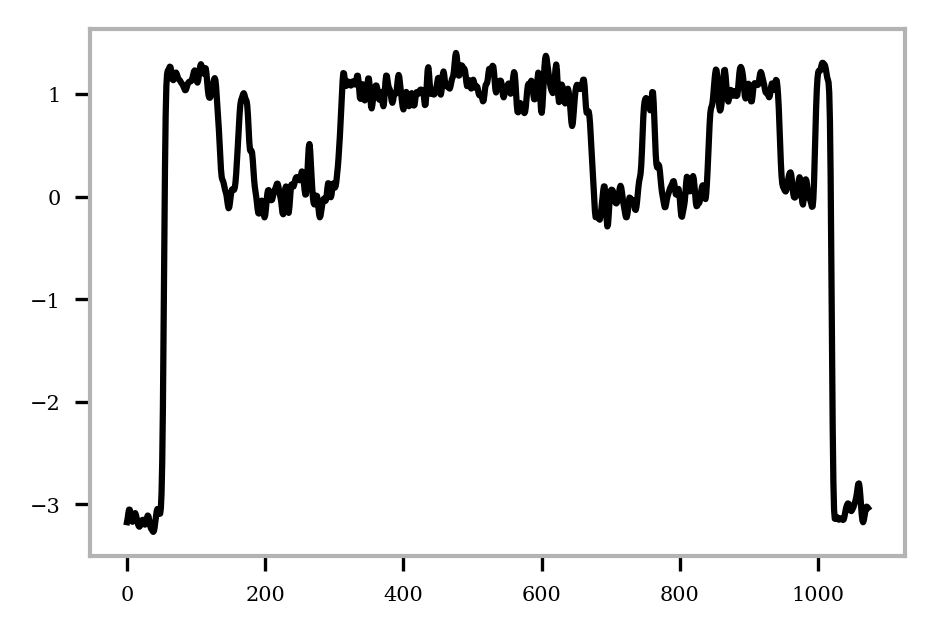

In [45]:
plt.plot(att_filtered[4,:,att_filtered.shape[2]//2])

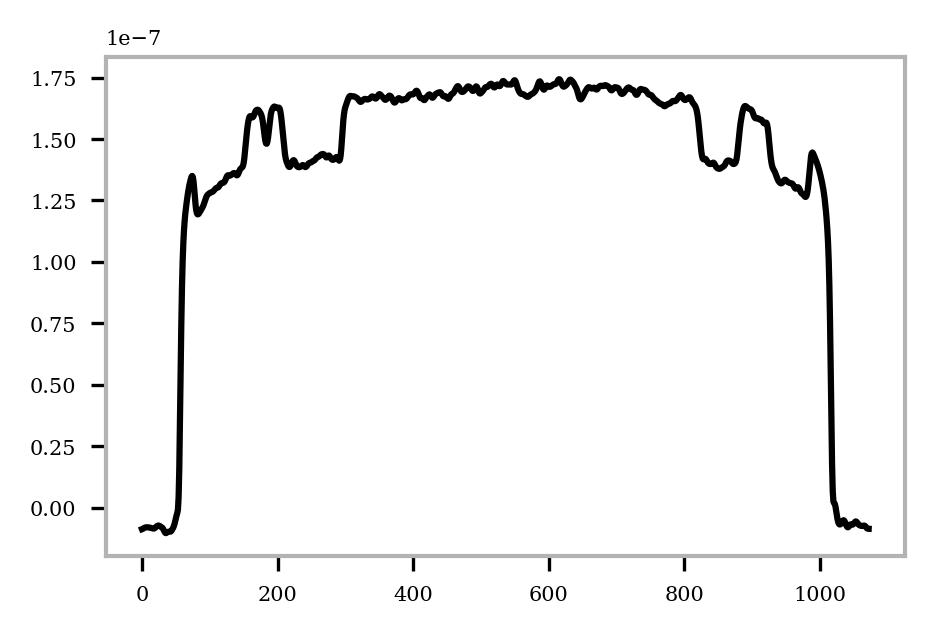

In [ ]:
plt.plot(ref_filtered[4,:, att_filtered.shape[2]//2])

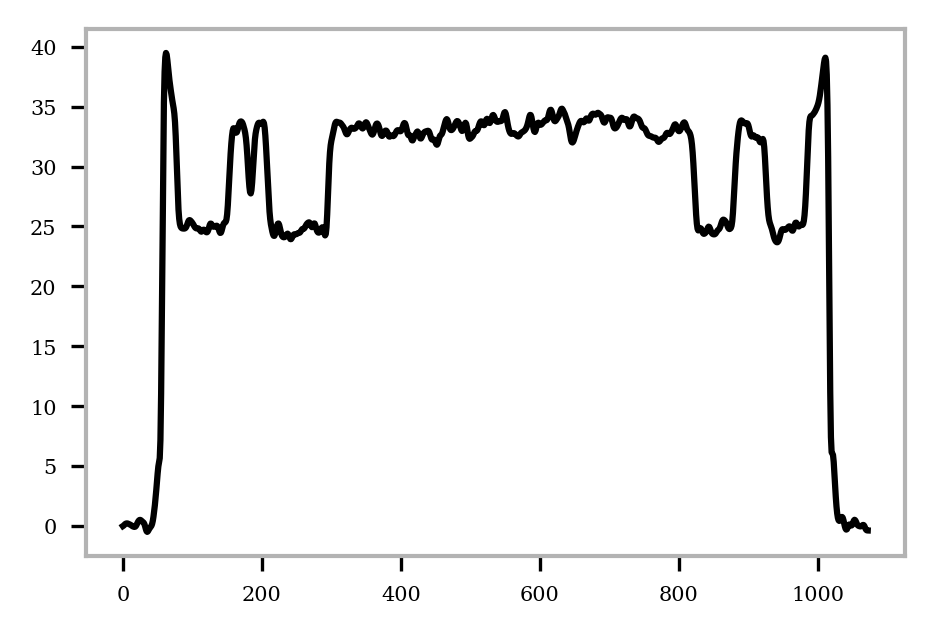

In [ ]:
plt.plot(fus_filtered[4,:, att_filtered.shape[2]//2])
#plt.plot(att_filtered[4,800,:])

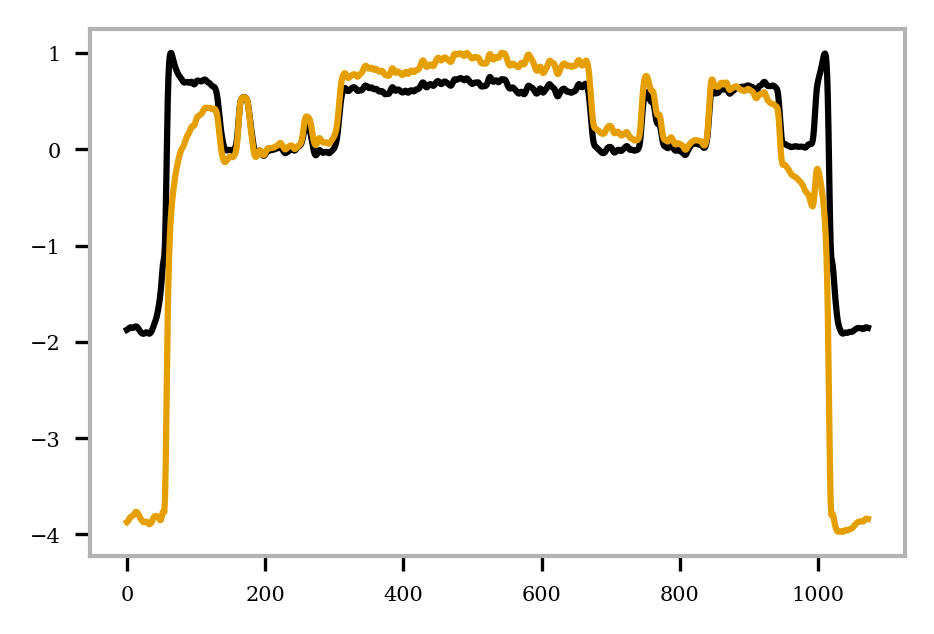

In [46]:
plt.plot(fus_filtered[4,:, att_filtered.shape[2]//2] / np.max(fus_filtered[4,:, att_filtered.shape[2]//2] ))
plt.plot(ref_filtered[4,:, att_filtered.shape[2]//2]/ np.max(ref_filtered[4,:, att_filtered.shape[2]//2]))
#plt.plot(att_filtered[4,800,:])

# Plot all

## Fusion

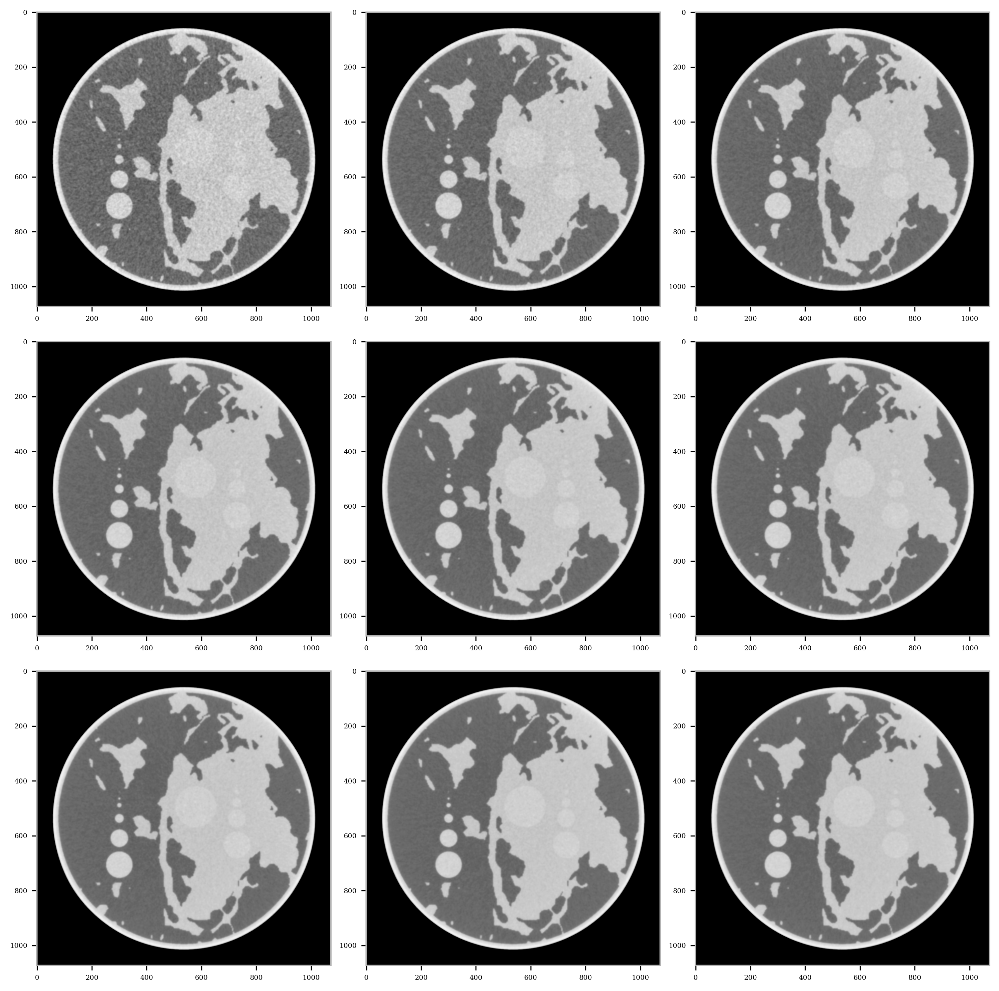

In [48]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(10,10))
axs = axs.ravel()

for dose in range(9):
    attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{(dose+1)*10}mGy.tif"))
    refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{(dose+1)*10}mGy.tif"))
    
    dphn = normalise(
        refraction.astype(np.float32),
        mask_adipose,
        mask_glandular,
        ref_ref)

    dattn = normalise(
        attenuation.astype(np.float32),
        mask_adipose,
        mask_glandular,
        att_ref)

    fused = fuse(dattn, dphn, sigma_FT_real_space_pixel)
    fus_filtered = scipy.ndimage.gaussian_filter(fused, sigma = [1.0, 2.0, 2.0])
    
    axs[dose].imshow(fus_filtered[4], vmin= vmin_abs, vmax = vmax_abs)
    
max_value = np.mean(fus_filtered[4][phantom == np.max(phantom)])

## Attenuation

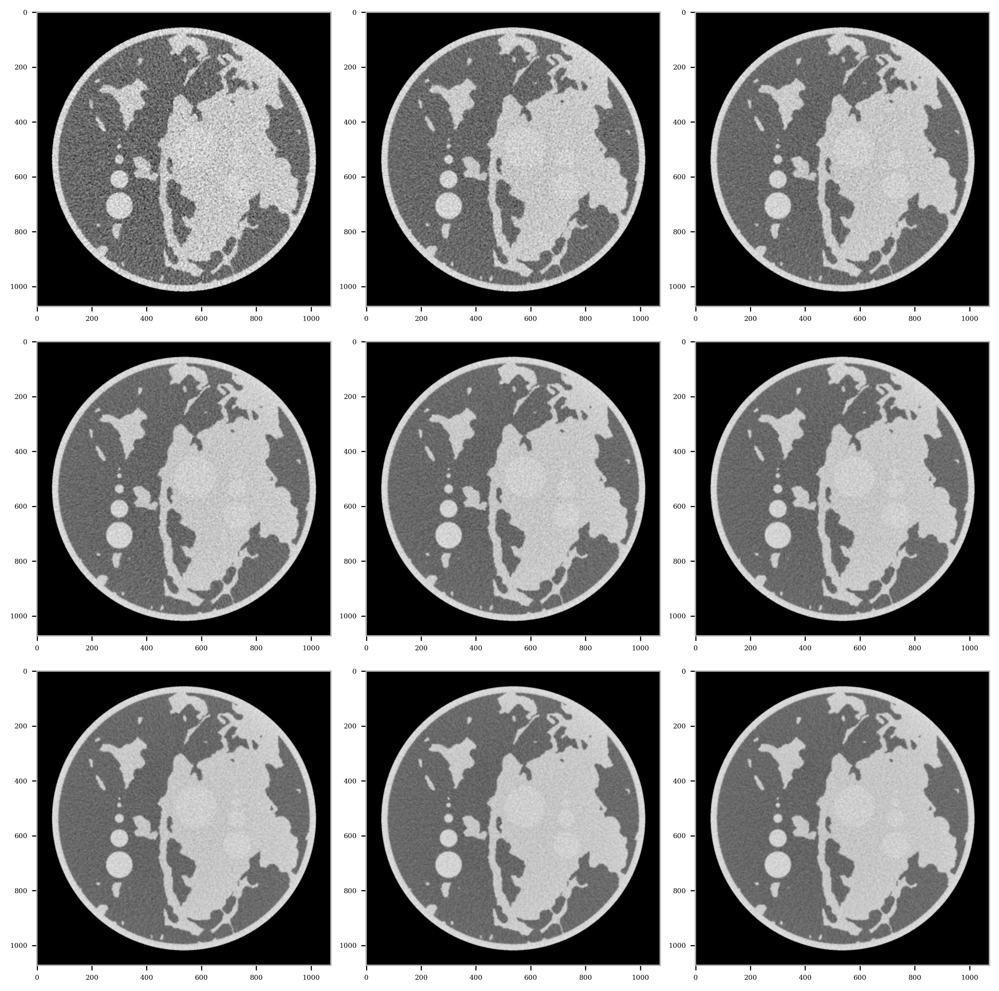

In [49]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(10,10))
axs = axs.ravel()

for dose in range(9):
    attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{(dose+1)*10}mGy.tif"))

    dattn = normalise(
        attenuation.astype(np.float32),
        mask_adipose,
        mask_glandular,
        att_ref)

    att_filtered = scipy.ndimage.gaussian_filter(dattn, sigma = [1.0, 2.0, 2.0])

    
    axs[dose].imshow(att_filtered[4], vmin= vmin_abs, vmax = vmax_abs)

## Refraction

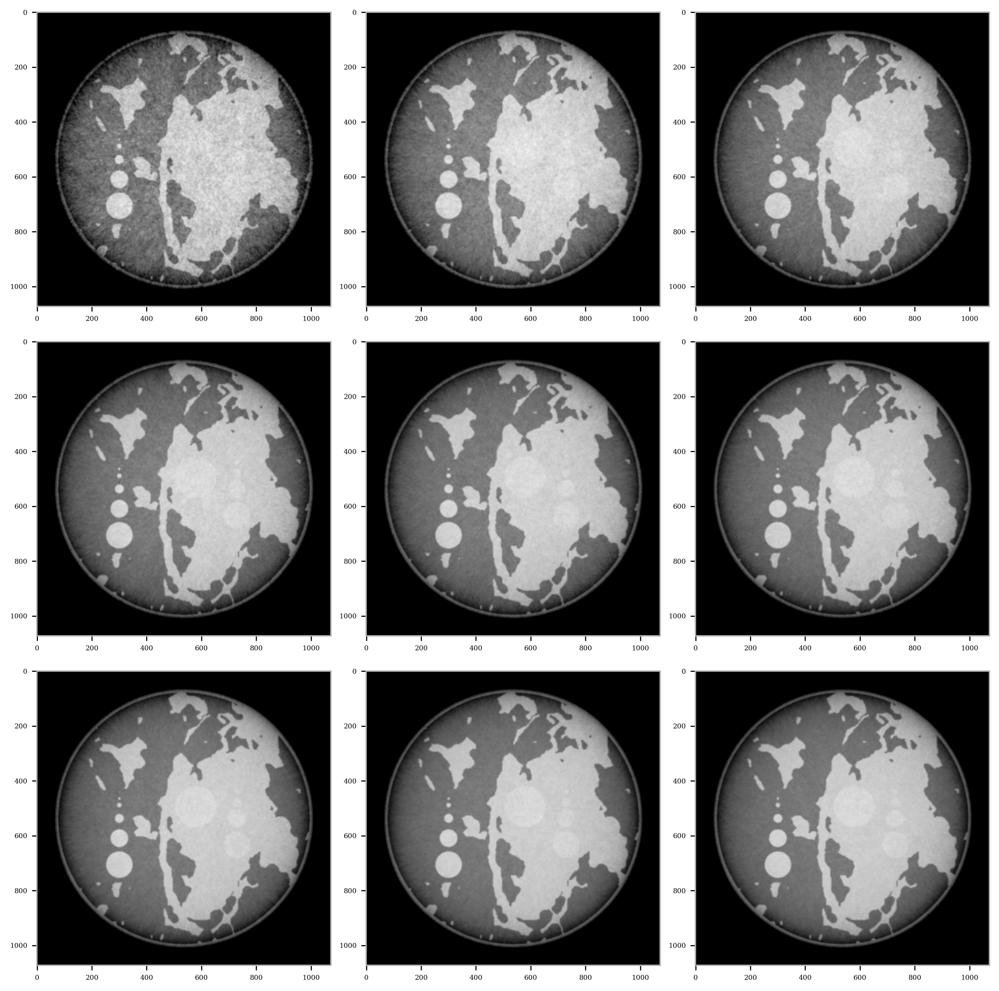

In [51]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(10,10))
axs = axs.ravel()


for dose in range(9):
    refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{(dose+1)*10}mGy.tif"))
    dphn = normalise(
        refraction.astype(np.float32),
        mask_adipose,
        mask_glandular,
        ref_ref)

    ref_filtered = scipy.ndimage.gaussian_filter(dphn, sigma = [1.0, 2.0, 2.0])
    axs[dose].imshow(ref_filtered[4], vmin = vmin_ref, vmax = vmax_ref)
    
max_value_ref = np.mean(ref_filtered[4][phantom == np.max(phantom)])

# Zoomed in regions

In [75]:
largest_feature = 0.3
features_px = (largest_feature) / voxel_size
im_size = att_filtered.shape[1]
row_start =  int(im_size / 2 + 5 * features_px)
row_end = int(im_size / 2 - 3 * features_px)

col_start = int(im_size / 2 - 0.22 * im_size - 2 * features_px)
col_end = int(im_size / 2 - 0.22 * im_size + 2 * features_px)

In [76]:
col_start

203

In [77]:
col_end

396

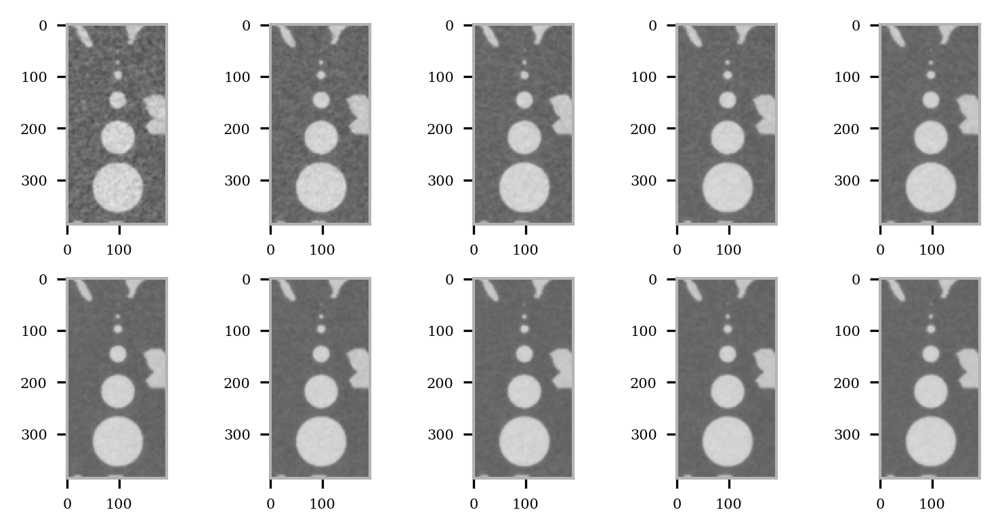

In [81]:
fig, axs = plt.subplots(nrows = 2, ncols = 5, figsize=(5,2.5))
axs = axs.ravel()

for dose in range(10):
    attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{(dose+1)*10}mGy.tif"))
    refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{(dose+1)*10}mGy.tif"))
    
    dphn = normalise(
        refraction.astype(np.float32),
        mask_adipose,
        mask_glandular,
        ref_ref)

    dattn = normalise(
        attenuation.astype(np.float32),
        mask_adipose,
        mask_glandular,
        att_ref)

    fused = fuse(dattn, dphn, sigma_FT_real_space_pixel)
    fus_filtered = scipy.ndimage.gaussian_filter(fused, sigma = [1.0, 2.0, 2.0])
    
    axs[dose].imshow(fus_filtered[4][row_end:row_start, col_start:col_end], vmin= vmin_abs, vmax = vmax_abs, interpolation = 'none')

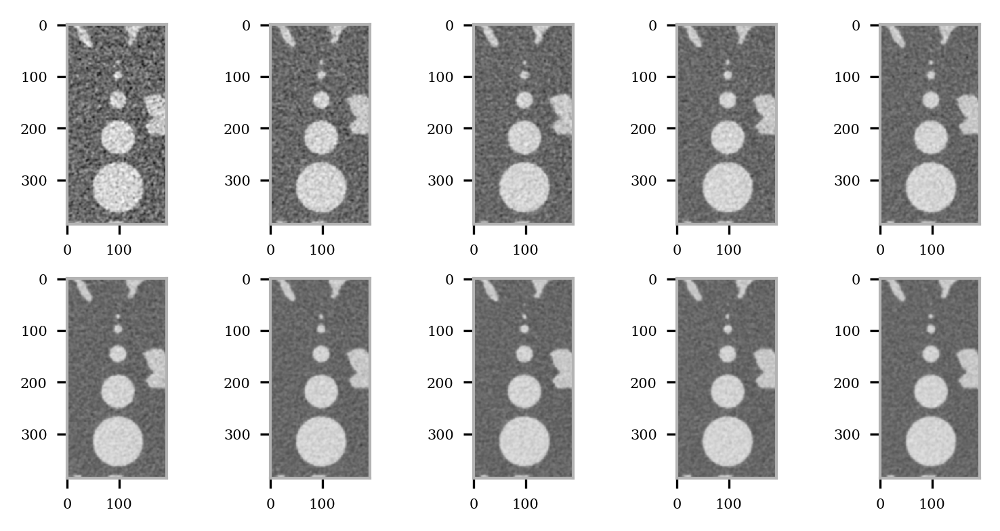

In [82]:
fig, axs = plt.subplots(nrows = 2, ncols = 5, figsize=(5,2.5))
axs = axs.ravel()

for dose in range(10):
    attenuation = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_absorption_{(dose+1)*10}mGy.tif"))
    dattn = normalise(
        attenuation.astype(np.float32),
        mask_adipose,
        mask_glandular,
        att_ref)

    att_filtered = scipy.ndimage.gaussian_filter(dattn, sigma = [1.0, 2.0, 2.0])

    
    axs[dose].imshow(att_filtered[4][row_end:row_start, col_start:col_end], vmin= vmin_abs, vmax = vmax_abs, interpolation = 'none')

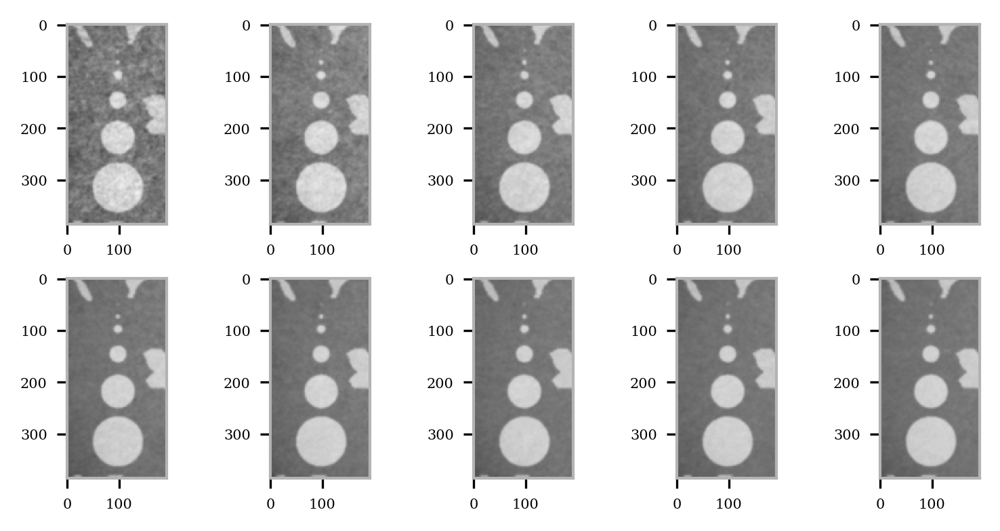

In [83]:
fig, axs = plt.subplots(nrows = 2, ncols = 5, figsize=(5,2.5))
axs = axs.ravel()

for dose in range(10):
    refraction = io.imread(os.path.join(storage, f"{system}_tumor/{system}_tumor_{sample_size_cm}_refraction_{(dose+1)*10}mGy.tif"))
    
    dphn = normalise(
        refraction.astype(np.float32),
        mask_adipose,
        mask_glandular,
        ref_ref)

    ref_filtered = scipy.ndimage.gaussian_filter(dphn, sigma = [1.0, 2.0, 2.0])

    axs[dose].imshow(ref_filtered[4][row_end:row_start, col_start:col_end], vmin= vmin_ref, vmax = vmax_ref, interpolation = 'none')

In [86]:
# Example usage in notebook 1
write_to_json(os.path.join(storage, f"{system}_tumor/{system}_cutoff_kernel.json"), sample_size=sample_size_cm, result=sigma_FT_real_space_pixel)